Data: https://drive.google.com/drive/folders/1jkk6u8xNYQscsyKfDas5ZQkRoqSnOe7z?usp=sharing

Import

In [1]:
import cv2
import json
import os
import numpy as np
import matplotlib.pyplot as plt
import shutil

Reading JSON file

In [2]:
f = open("hand.json", "r")
data = json.load(f)

In [3]:
def get_metadata(file_name):
    f = open(file_name, "r")
    data = json.load(f)
    print(data.keys())
    return data["_via_img_metadata"]

In [4]:
metadata = get_metadata("hand.json")

dict_keys(['_via_settings', '_via_img_metadata', '_via_attributes', '_via_data_format_version', '_via_image_id_list'])


In [5]:
def show_images_plot(org_img, modif_img, org_img_name="Original Image", modif_img_name="Annotated Image"):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title(org_img_name)
    plt.imshow(org_img)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(modif_img_name)
    plt.imshow(modif_img)
    plt.axis("off")

    plt.show()

In [6]:

def labelling_images(img_dir, temp_metadata):
    original_rgb_list = []
    img_rgb_list = []
    for key, value in temp_metadata.items():
        filename = value["filename"]
        img_path = os.path.join(img_dir, filename)

        img = cv2.imread(img_path)

        scale = 0.3
        img = cv2.resize(img, (0, 0), fx=scale, fy=scale)
        original_img = img.copy()

        for region in value["regions"]:
            shape_attr = region["shape_attributes"]
            all_points_x = [int(x * scale) for x in shape_attr["all_points_x"]]
            all_points_y = [int(y * scale) for y in shape_attr["all_points_y"]]

            points = [(x, y) for x, y in zip(all_points_x, all_points_y)]
            points = np.array(points, dtype=np.int32).reshape((-1, 1, 2))

            cv2.polylines(img, [points], isClosed=True, color=(0, 255, 0), thickness=2)

        # Add label for a class
        region_attributes = value["regions"][0]["region_attributes"]
        class_label = region_attributes.get("fingers", "unknown")
        font = cv2.FONT_HERSHEY_SIMPLEX
        label_position = (850, 850)
        font_scale = 2.0
        color = (10, 248, 255)
        thickness = 3

        cv2.putText(img, f"fingers: {class_label}", label_position, font, font_scale, color, thickness, cv2.LINE_AA)

        original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        original_rgb_list.append(original_rgb)

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_rgb_list.append(img_rgb)

    return original_rgb_list, img_rgb_list

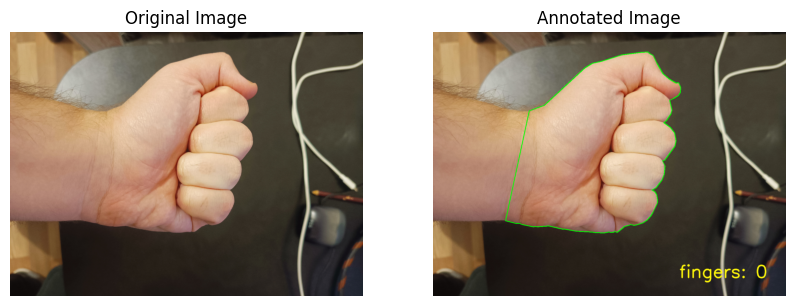

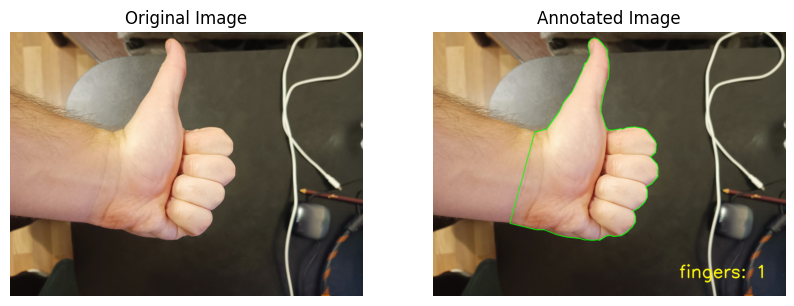

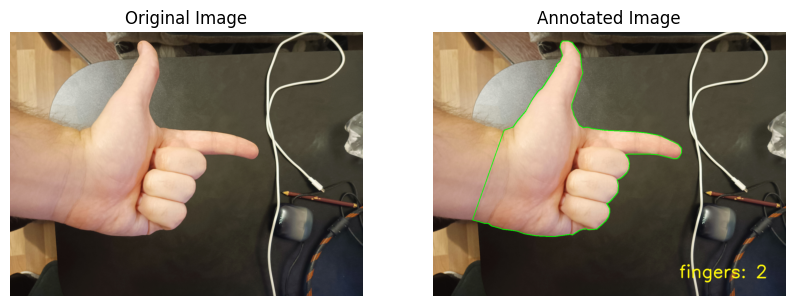

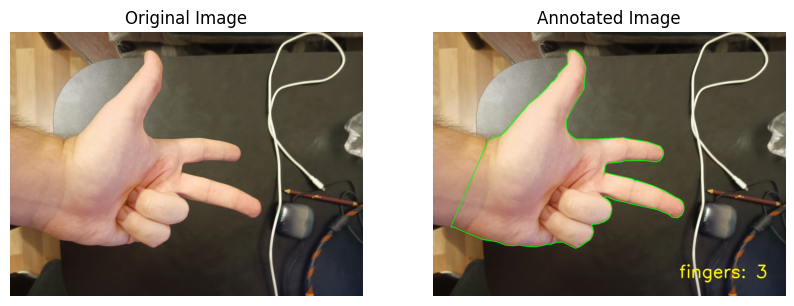

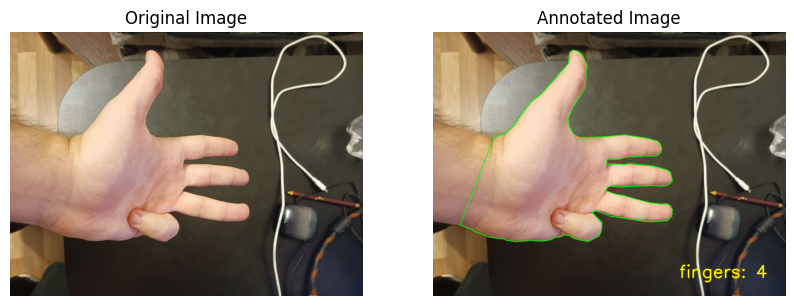

...

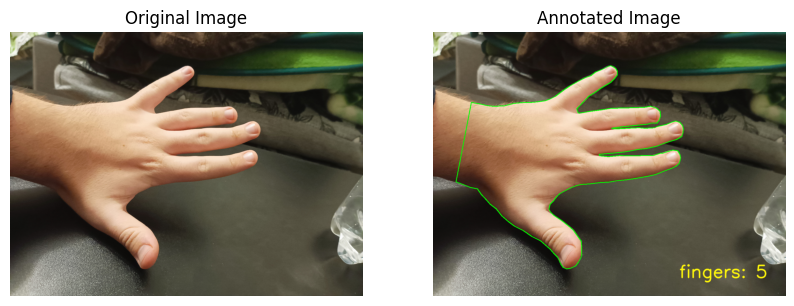

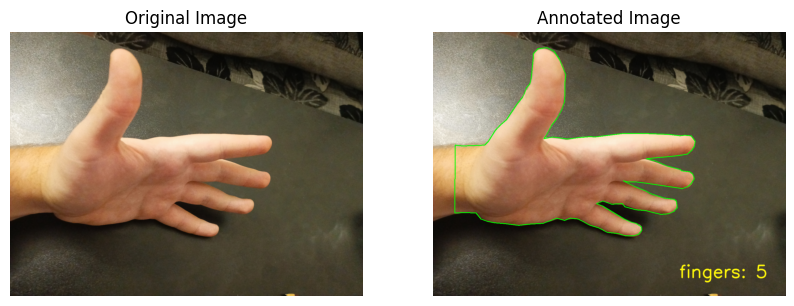

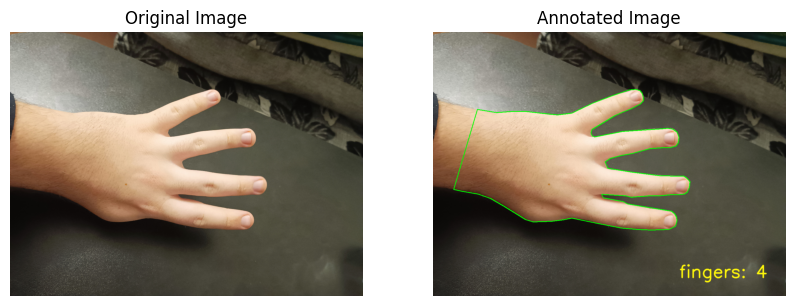

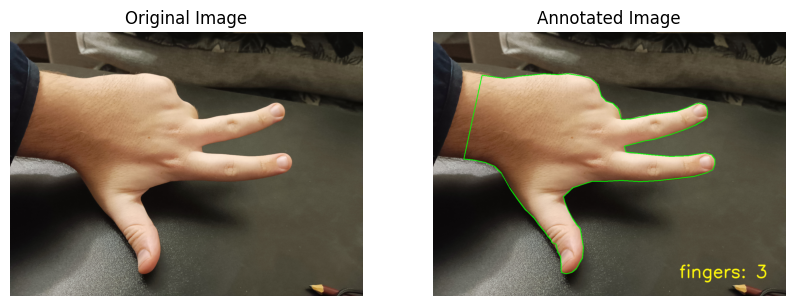

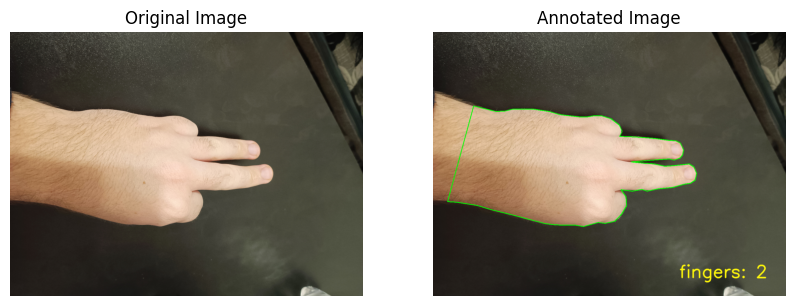

In [7]:
org_img_dir = "./hand_images"
original, modified = labelling_images(img_dir=org_img_dir, temp_metadata=metadata)
for o, m in zip(original, modified):
    show_images_plot(org_img=o, modif_img=m)

In [8]:
def flip_image_and_polygons(img, polygons, axis=1):
    h, w, _ = img.shape
    flipped_img = cv2.flip(img, axis)

    flipped_polygons = []
    for poly in polygons:
        points = np.array(poly, dtype=np.int32)
        if axis == 1:
            points[:, 0] = w - points[:, 0]
        elif axis == 0:
            points[:, 1] = h - points[:, 1]
        flipped_polygons.append(points.tolist())
    return flipped_img, flipped_polygons

In [9]:
augmented_dir = "./augmented_hand_images"
augmented_file = "augmented_hand.json"

augmented_metadata = metadata.copy()
via_image_id_list = data["_via_image_id_list"].copy()

os.makedirs(augmented_dir, exist_ok=True)

for img_id in data["_via_image_id_list"]:
    value = augmented_metadata[img_id]
    filename = value["filename"]

    original_img_path = os.path.join(org_img_dir, filename)
    augmented_img_path = os.path.join(augmented_dir, filename)
    
    shutil.copy2(original_img_path, augmented_img_path)

    img = cv2.imread(original_img_path)
    if img is None:
        print(f"Failed to read {filename}")
        continue

    polygons = []
    for region in value["regions"]:
        shape_attr = region["shape_attributes"]
        all_points_x = shape_attr["all_points_x"]
        all_points_y = shape_attr["all_points_y"]
        polygons.append(list(zip(all_points_x, all_points_y)))

    # Augmentation - vertical flip
    flipped_img, flipped_polygons = flip_image_and_polygons(img, polygons, axis=0)
    flipped_filename = f"flipped_{filename}"
    flipped_img_path = os.path.join(augmented_dir, flipped_filename)
    cv2.imwrite(flipped_img_path, flipped_img)

    new_img_id = f"{flipped_filename}{value['size']}"
    via_image_id_list.append(new_img_id)

    augmented_metadata[new_img_id] = {
        "filename": flipped_filename,
        "size": value["size"],
        "regions": [
            {
                "shape_attributes": {
                    "name": "polygon",
                    "all_points_x": [point[0] for point in poly],
                    "all_points_y": [point[1] for point in poly]
                },
                "region_attributes": region["region_attributes"]
            }
            for poly, region in zip(flipped_polygons, value["regions"])
        ],
        "file_attributes": value["file_attributes"]
    }

# new JSON
augmented_data = {
    "_via_settings": data["_via_settings"],
    "_via_img_metadata": augmented_metadata,
    "_via_attributes": data["_via_attributes"],
    "_via_data_format_version": data["_via_data_format_version"],
    "_via_image_id_list": via_image_id_list
}

with open(augmented_file, "w") as f:
    json.dump(augmented_data, f)

print("Augmentation is complete. All images saved to:", augmented_dir)

Augmentation is complete. All images saved to: ./augmented_hand_images


Selected type of data augmentation is a vertical flip transformation. This operation reflects the image across the horizontal axis, producing a vertically inverted version of the original image.

The original images were included in the augmented dataset without modification.

dict_keys(['_via_settings', '_via_img_metadata', '_via_attributes', '_via_data_format_version', '_via_image_id_list'])
Counts: (48, 48)


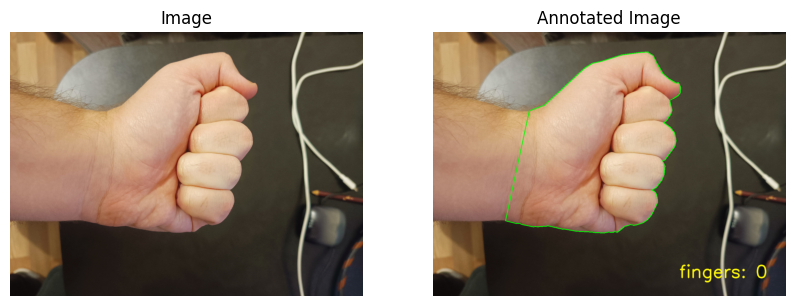

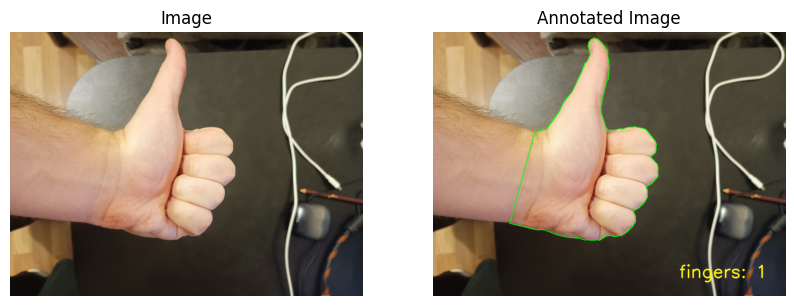

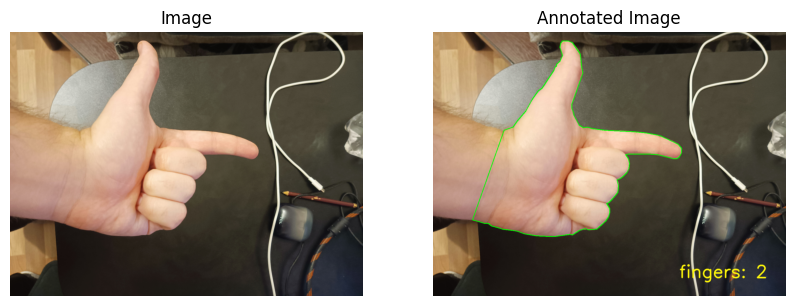

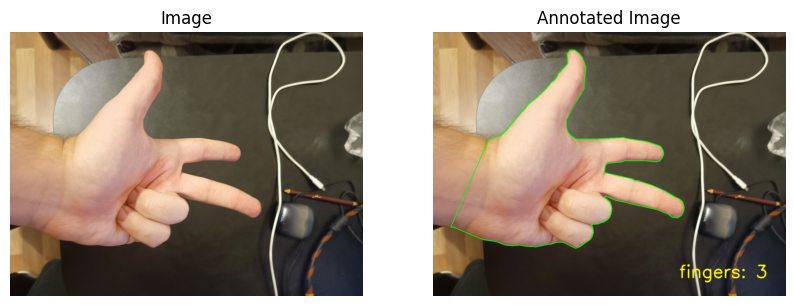

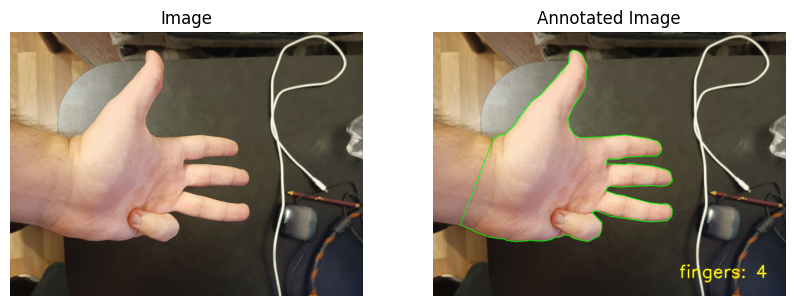

...

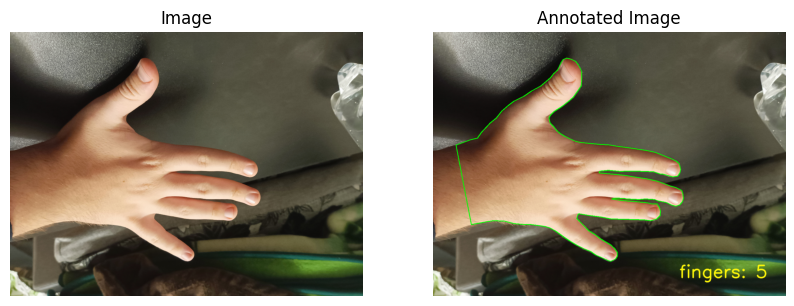

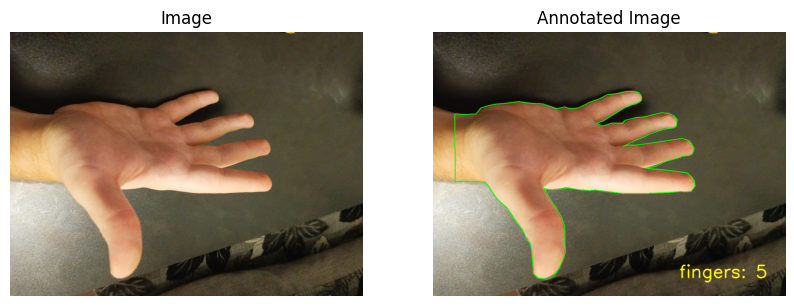

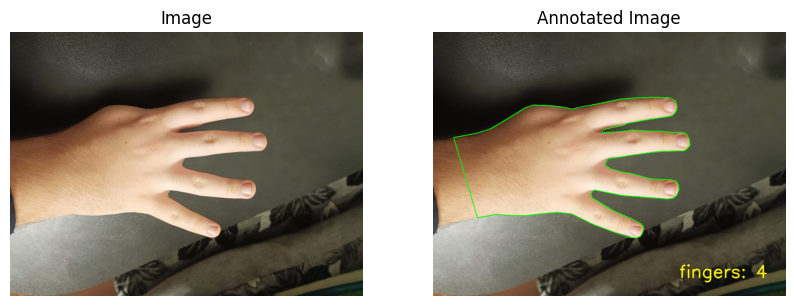

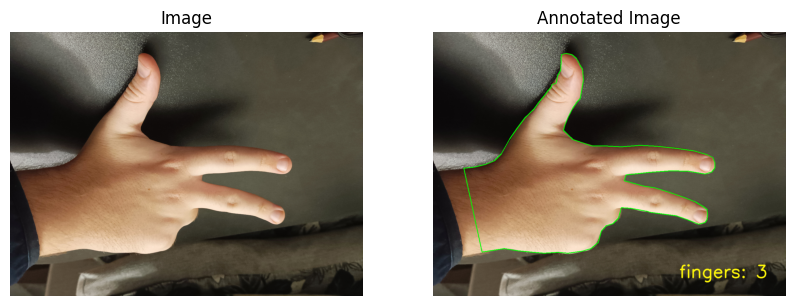

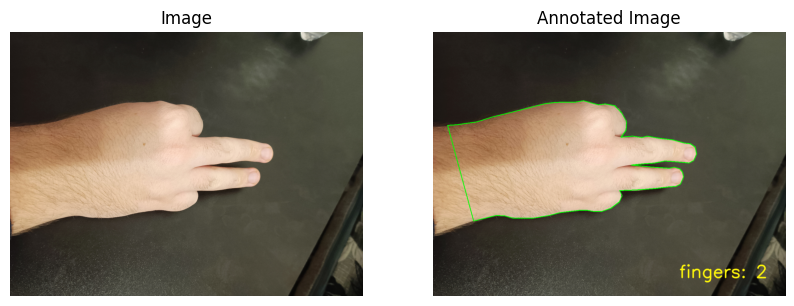

In [10]:
augmented_metadata = get_metadata(augmented_file)
original, modified = labelling_images(img_dir=augmented_dir, temp_metadata=augmented_metadata)
print(f'Counts: {len(original), len(modified)}')
for o, m in zip(original, modified):
    show_images_plot(org_img=o, modif_img=m, org_img_name="Image")